In [1]:
%%capture 
%run "./utils.ipynb"

In [3]:
clean_df = pd.read_csv('../data/clean_df.csv')
sessions_df = pd.read_csv('../data/sessions_df.csv')
clean_df.head()

/home/sem/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3058: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,Unnamed: 0,Bearer Id,Start,Start ms,End,End ms,Dur. (ms),IMSI,MSISDN/Number,IMEI,...,Netflix DL,Netflix UL,Gaming DL,Gaming UL,Other DL,Other UL,Total UL,Total DL,difference,duration
0,1970-01-01 00:00:00.000000000,13114483460844900352,2019-04-04 12:01:18,770.0,2019-04-25 14:35:31,662.0,1823652.0,2.082014e+14,3.366496e+10,3.552121e+13,...,8.198936,9.656251,278.082303,14.344150,171.744450,8.814393,36.749741,308.879636,21 days 02:34:13,1823653.0
1,1970-01-01 00:00:00.000000001,13114483482878900224,2019-04-09 13:04:04,235.0,2019-04-25 08:15:48,606.0,1365104.0,2.082019e+14,3.368185e+10,3.579401e+13,...,18.338413,17.227132,608.750074,1.170709,526.904238,15.055145,53.800391,653.384965,15 days 19:11:44,1365104.0
2,1970-01-01 00:00:00.000000002,13114483484080500736,2019-04-09 17:42:11,1.0,2019-04-25 11:58:13,652.0,1361762.0,2.082003e+14,3.376063e+10,3.528151e+13,...,17.587794,6.163408,229.584621,0.395630,410.692588,4.215763,27.883638,279.807335,15 days 18:16:02,1361762.0
3,1970-01-01 00:00:00.000000003,13114483485442799616,2019-04-10 00:31:25,486.0,2019-04-25 07:36:35,171.0,1321509.0,2.082014e+14,3.375034e+10,3.535661e+13,...,13.994646,1.097942,799.538153,10.849722,749.039933,12.797283,43.324218,846.028530,15 days 07:05:10,1321510.0
4,1970-01-01 00:00:00.000000004,13114483499480700928,2019-04-12 20:10:23,565.0,2019-04-25 10:40:32,954.0,1089009.0,2.082014e+14,3.369980e+10,3.540701e+13,...,17.124581,0.415218,527.707248,3.529801,550.709500,13.910322,38.542814,569.138589,12 days 14:30:09,1089009.0


In [4]:
clean_df.columns.tolist()

['Unnamed: 0',
 'Bearer Id',
 'Start',
 'Start ms',
 'End',
 'End ms',
 'Dur. (ms)',
 'IMSI',
 'MSISDN/Number',
 'IMEI',
 'Last Location Name',
 'Avg RTT DL (ms)',
 'Avg RTT UL (ms)',
 'Avg Bearer TP DL (kbps)',
 'Avg Bearer TP UL (kbps)',
 'DL TP < 50 Kbps (%)',
 '50 Kbps < DL TP < 250 Kbps (%)',
 '250 Kbps < DL TP < 1 Mbps (%)',
 'DL TP > 1 Mbps (%)',
 'UL TP < 10 Kbps (%)',
 '10 Kbps < UL TP < 50 Kbps (%)',
 '50 Kbps < UL TP < 300 Kbps (%)',
 'UL TP > 300 Kbps (%)',
 'Activity Duration DL (ms)',
 'Activity Duration UL (ms)',
 'Dur. (ms).1',
 'Handset Manufacturer',
 'Handset Type',
 'Nb of sec with Vol DL < 6250B',
 'Nb of sec with Vol UL < 1250B',
 'Social Media DL',
 'Social Media UL',
 'Google DL',
 'Google UL',
 'Email DL',
 'Email UL',
 'Youtube DL',
 'Youtube UL',
 'Netflix DL',
 'Netflix UL',
 'Gaming DL',
 'Gaming UL',
 'Other DL',
 'Other UL',
 'Total UL',
 'Total DL',
 'difference',
 'duration']

In [64]:
main_df = pd.read_excel('../data/Week1_challenge_data_source.xlsx')

In [65]:
focus_columns = ["Avg RTT DL (ms)",
"Avg RTT UL (ms)",
"Avg Bearer TP DL (kbps)",
"Avg Bearer TP UL (kbps)",
"TCP DL Retrans. Vol (Bytes)",
"TCP UL Retrans. Vol (Bytes)",
"Handset Type"]

In [66]:
focused_df = main_df[focus_columns]

In [67]:
focused_df.isnull().sum()

Avg RTT DL (ms)                27829
Avg RTT UL (ms)                27812
Avg Bearer TP DL (kbps)            1
Avg Bearer TP UL (kbps)            1
TCP DL Retrans. Vol (Bytes)    88146
TCP UL Retrans. Vol (Bytes)    96649
Handset Type                     572
dtype: int64

In [68]:
focused_df.head()

,Avg RTT DL (ms),Avg RTT UL (ms),Avg Bearer TP DL (kbps),Avg Bearer TP UL (kbps),TCP DL Retrans. Vol (Bytes),TCP UL Retrans. Vol (Bytes),Handset Type
0,42.0,5.0,23.0,44.0,NaN,NaN,Samsung Galaxy A5 Sm-A520F
1,65.0,5.0,16.0,26.0,NaN,NaN,Samsung Galaxy J5 (Sm-J530)
2,NaN,NaN,6.0,9.0,NaN,NaN,Samsung Galaxy A8 (2018)
3,NaN,NaN,44.0,44.0,NaN,NaN,undefined
4,NaN,NaN,6.0,9.0,NaN,NaN,Samsung Sm-G390F


In [69]:
focused_df = focused_df[focused_df['Avg RTT DL (ms)'].notnull()]
focused_df = focused_df[focused_df['Avg RTT UL (ms)'].notnull()]
focused_df = focused_df[focused_df['Handset Type'].notnull()]

In [70]:
focused_df.isnull().sum()

Avg RTT DL (ms)                    0
Avg RTT UL (ms)                    0
Avg Bearer TP DL (kbps)            0
Avg Bearer TP UL (kbps)            0
TCP DL Retrans. Vol (Bytes)    60350
TCP UL Retrans. Vol (Bytes)    68842
Handset Type                       0
dtype: int64

In [71]:
# fill with mode
focused_df['TCP DL Retrans. Vol (Bytes)'] = focused_df['TCP DL Retrans. Vol (Bytes)'].fillna(focused_df['TCP DL Retrans. Vol (Bytes)'].median())
focused_df['TCP UL Retrans. Vol (Bytes)'] = focused_df['TCP UL Retrans. Vol (Bytes)'].fillna(focused_df['TCP UL Retrans. Vol (Bytes)'].median())

In [72]:
focused_df.isnull().sum()

Avg RTT DL (ms)                0
Avg RTT UL (ms)                0
Avg Bearer TP DL (kbps)        0
Avg Bearer TP UL (kbps)        0
TCP DL Retrans. Vol (Bytes)    0
TCP UL Retrans. Vol (Bytes)    0
Handset Type                   0
dtype: int64

In [73]:
focused_df.head()

,Avg RTT DL (ms),Avg RTT UL (ms),Avg Bearer TP DL (kbps),Avg Bearer TP UL (kbps),TCP DL Retrans. Vol (Bytes),TCP UL Retrans. Vol (Bytes),Handset Type
0,42.0,5.0,23.0,44.0,573621.0,21035.0,Samsung Galaxy A5 Sm-A520F
1,65.0,5.0,16.0,26.0,573621.0,21035.0,Samsung Galaxy J5 (Sm-J530)
6,102.0,5.0,22.0,38.0,573621.0,21035.0,Huawei Mate 20 Lite
7,39.0,18.0,3698.0,416.0,19520.0,21035.0,undefined
9,97.0,7.0,3845.0,2535.0,3231397.0,7230.0,Samsung Galaxy Note 8 (Sm-N950F Ds)


In [74]:
Users = focused_df.groupby(focused_df.index)
total_RTT = Users["Avg RTT DL (ms)"].sum()+ Users["Avg RTT UL (ms)"].sum()
total_bearer_TP = Users["Avg Bearer TP DL (kbps)"].sum()+ Users["Avg Bearer TP UL (kbps)"].sum()
total_TCP = Users["TCP DL Retrans. Vol (Bytes)"].sum()+ Users["TCP UL Retrans. Vol (Bytes)"].sum()

In [75]:
focused_df = pd.concat([focused_df, total_RTT,total_bearer_TP, total_TCP], axis="columns", sort=True)
focused_df.head()

,Avg RTT DL (ms),Avg RTT UL (ms),Avg Bearer TP DL (kbps),Avg Bearer TP UL (kbps),TCP DL Retrans. Vol (Bytes),TCP UL Retrans. Vol (Bytes),Handset Type,0,1,2
0,42.0,5.0,23.0,44.0,573621.0,21035.0,Samsung Galaxy A5 Sm-A520F,47.0,67.0,594656.0
1,65.0,5.0,16.0,26.0,573621.0,21035.0,Samsung Galaxy J5 (Sm-J530),70.0,42.0,594656.0
6,102.0,5.0,22.0,38.0,573621.0,21035.0,Huawei Mate 20 Lite,107.0,60.0,594656.0
7,39.0,18.0,3698.0,416.0,19520.0,21035.0,undefined,57.0,4114.0,40555.0
9,97.0,7.0,3845.0,2535.0,3231397.0,7230.0,Samsung Galaxy Note 8 (Sm-N950F Ds),104.0,6380.0,3238627.0


In [79]:
focused_df.groupby('Handset Type')[1].head()

0            67.0
1            42.0
6            60.0
7          4114.0
9          6380.0
           ...   
149488    28794.0
149598      360.0
149605      110.0
149743      876.0
149860    10411.0
Name: 1, Length: 3812, dtype: float64

In [80]:
focused_df['Handset Type'].nunique()

1351

### Average Bearer throughput

In [85]:
focused_df[1].mean()

18488.606632929695

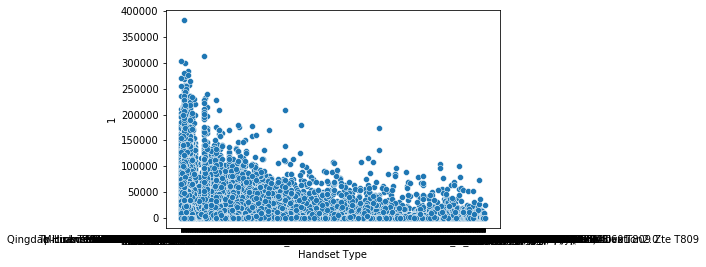

In [83]:
import seaborn as sns
sns.scatterplot(data=focused_df, x="Handset Type", y=1)

### Average TCP transmission

In [86]:
focused_df[2].mean()

11145855.584821649